# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [1]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

C:\Users\DELL\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


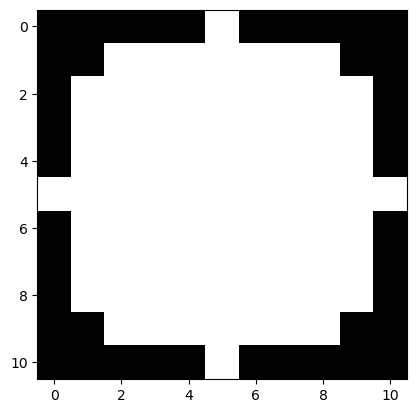

In [2]:
if student :
  strell = morpho.disk(radius = 5)

print(strell)
plt.imshow(strell,cmap = plt.cm.gray)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1 1]
 [1 1]
 [1 1]
 [1 1]
 [1 1]]


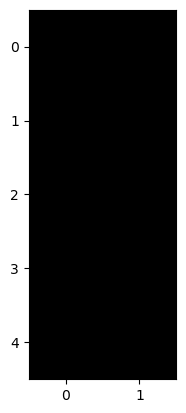

In [3]:
def line_strell(width,length):
  if student :
    strell = morpho.rectangle( ncols = width, nrows = length)
  return strell

strell = line_strell(2,5)
print(strell)
plt.imshow(strell,cmap = plt.cm.gray)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

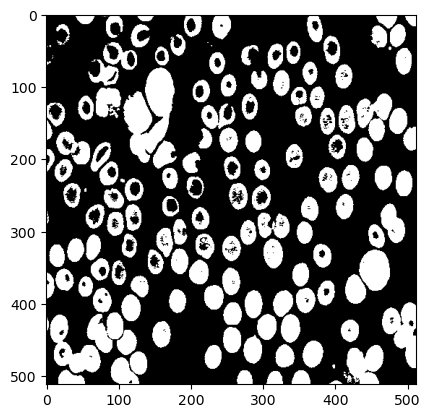

In [4]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  threshold = 150
  binary_img = img < threshold * 1
plt.imshow(binary_img, cmap = plt.cm.gray)
plt.show()

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

In [5]:
def binary_morph(binary_img, strell):
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.binary_erosion(binary_img,strell),morpho.binary_dilation(binary_img,strell),
          morpho.binary_opening(binary_img,strell),morpho.binary_closing(binary_img,strell)]
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

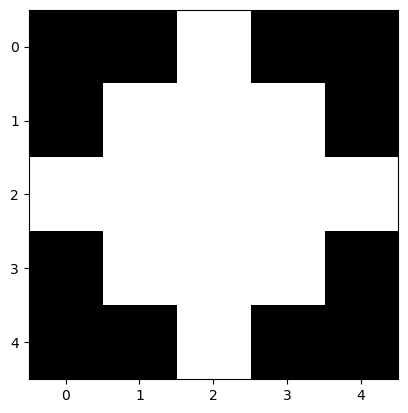

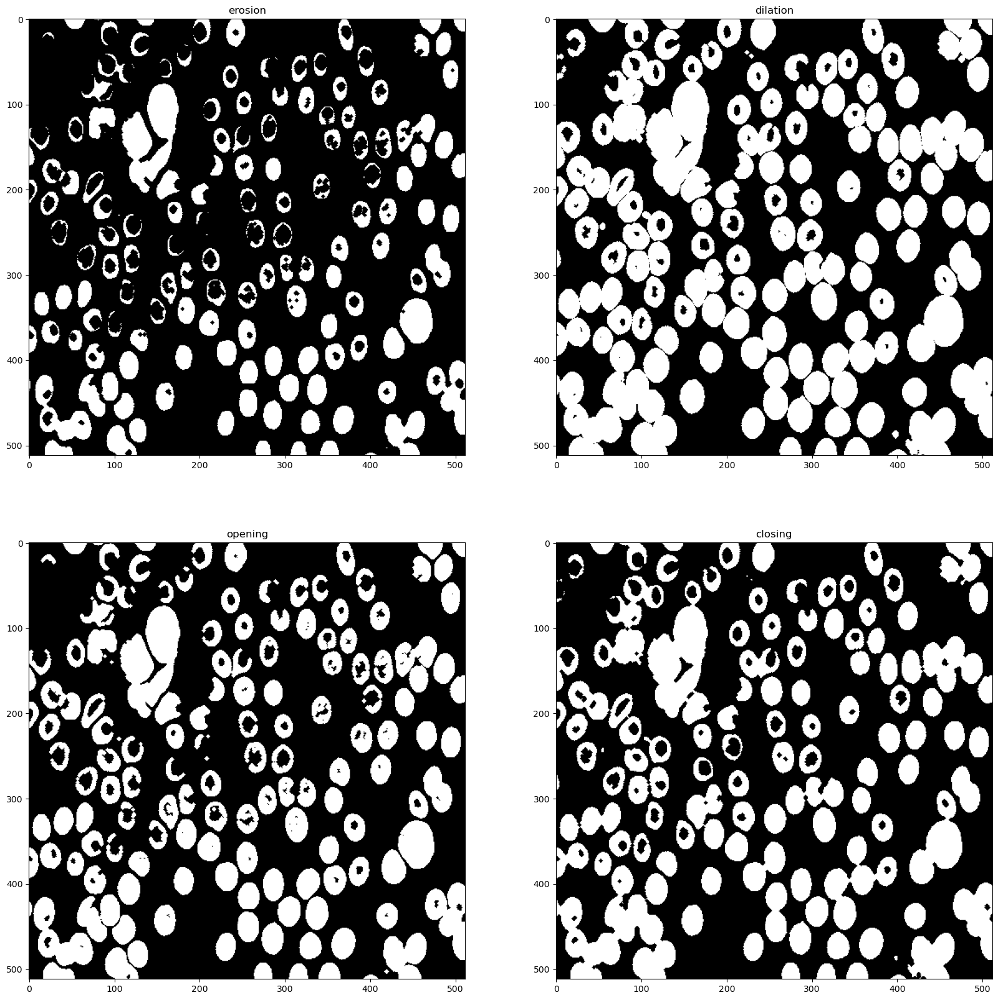

In [6]:
strell = morpho.disk(2)
plt.imshow(strell, cmap = plt.cm.gray)
binary_morph(binary_img,strell)

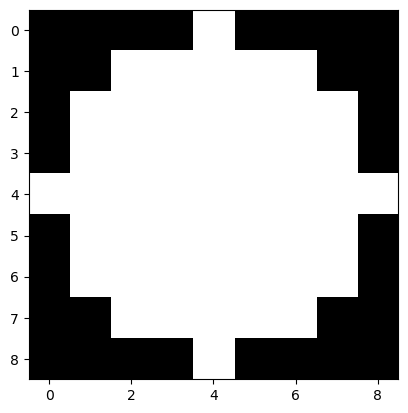

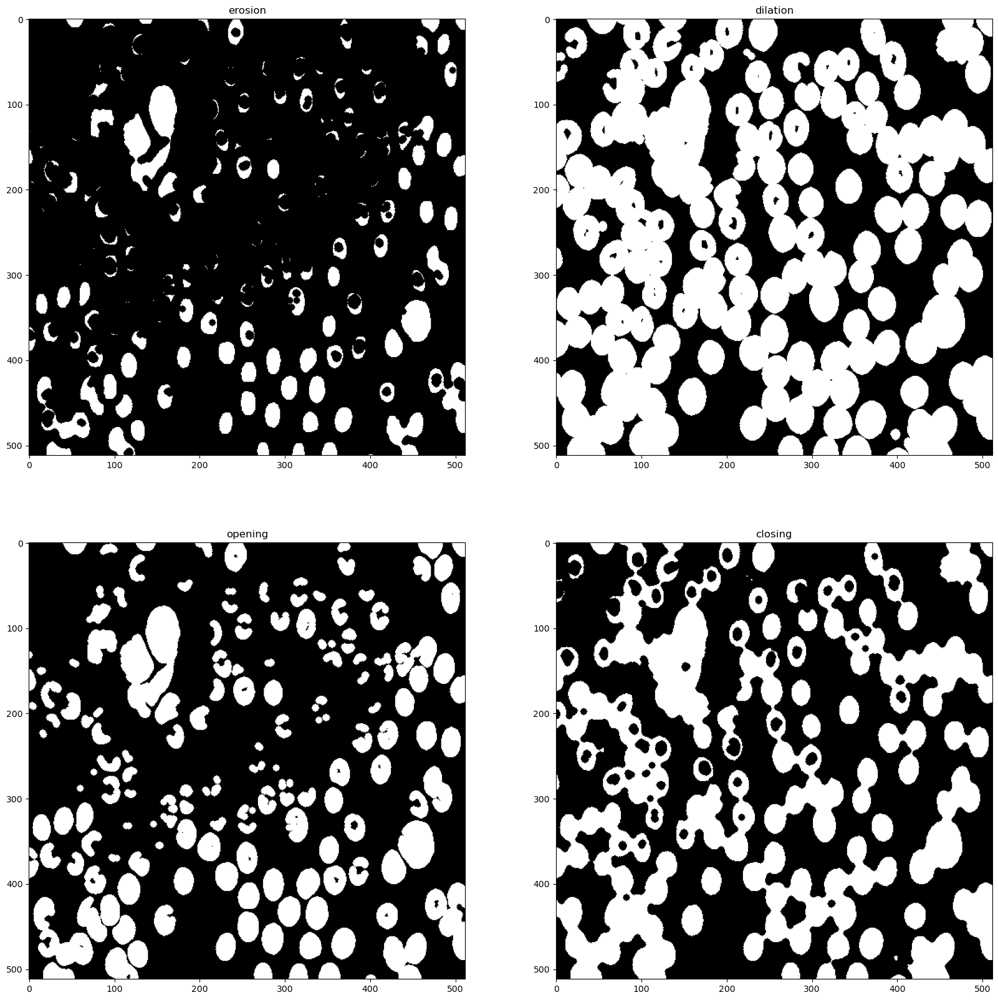

In [7]:
strell = morpho.disk(4)
plt.imshow(strell, cmap = plt.cm.gray)
binary_morph(binary_img,strell)

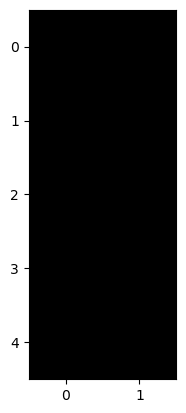

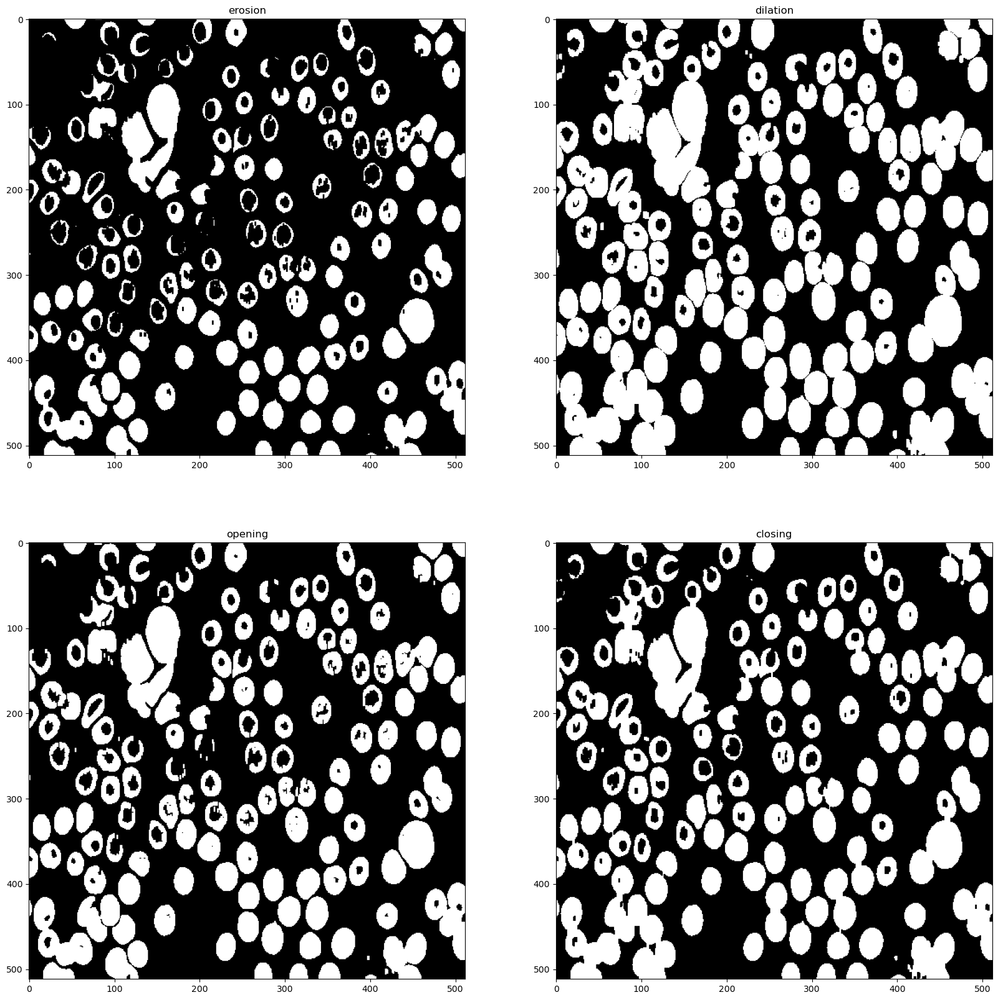

In [8]:
strell = line_strell(2,5)
plt.imshow(strell, cmap = plt.cm.gray)
binary_morph(binary_img,strell)

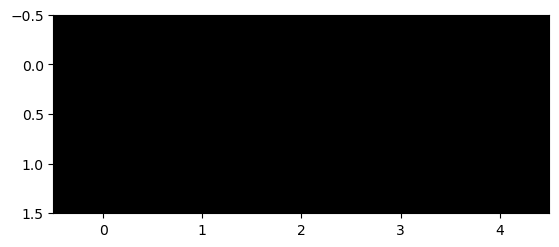

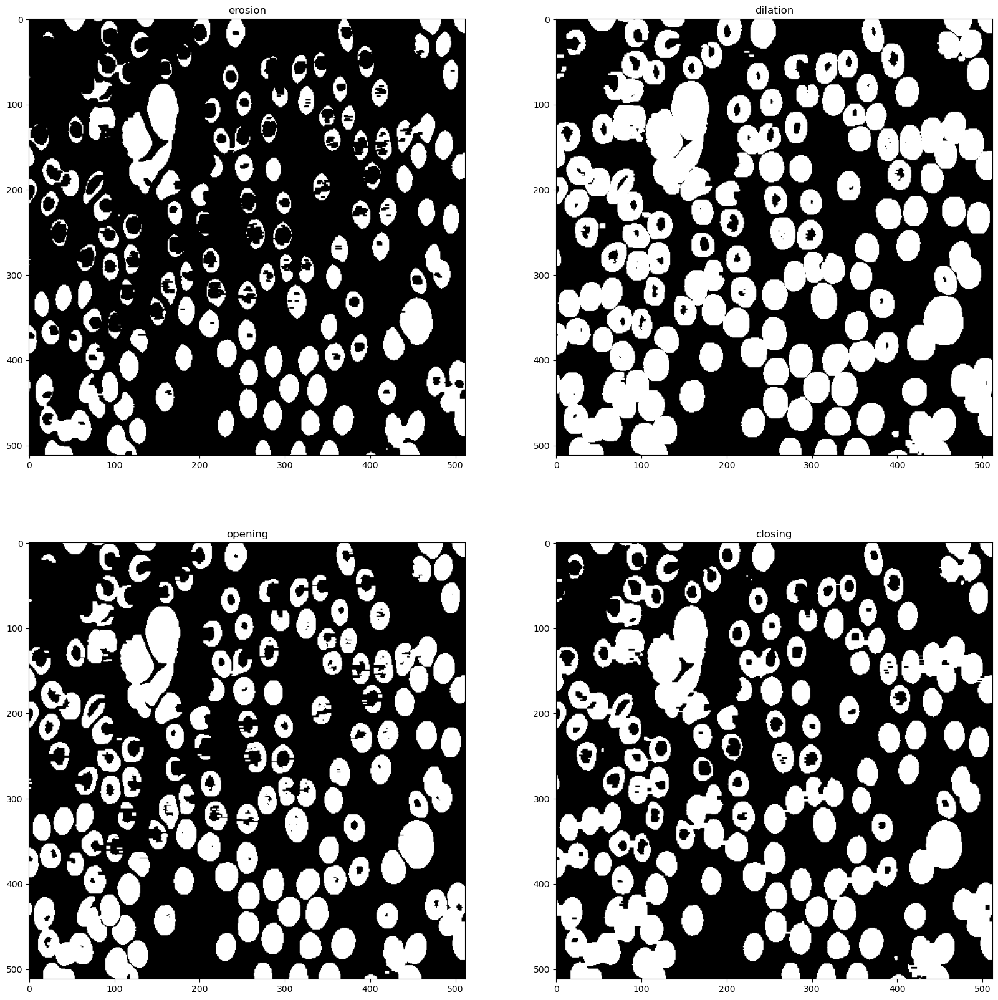

In [9]:
strell = line_strell(5,2)
plt.imshow(strell, cmap = plt.cm.gray)
binary_morph(binary_img,strell)

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : **In this section, we tested three different shapes of structuring elements (disk, vertical line, horizontal line). Since the disk is isotropic, when applied in dilation (or erosion), it expands (or shrinks) the boundaries of objects uniformly in all directions. This means that when applying it to an opening (or a closure), it smoothens the boundaries of objects (or closes small gaps) while maintaining their general shapes. Meanwhile, when applying a vertical line (or horizontal line), it emphasizes its orientation and modifies the roundness of the contours.**
- **Q** : What is the influence of the size of the structuring element ?
- **A** : **When applying a disk with a radius of two, the effect will be confined to a smaller local area. In erosion for exemple, it will eliminate small details while preserving larger structures. On the other hand, a disk with a radius of four will have a broader impact, modifying the shapes of objects, connecting larger objects in dilation, and potentially eliminating some objects in erosion. In general, the smaller structuring element is more selective and precise in its actions.**

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


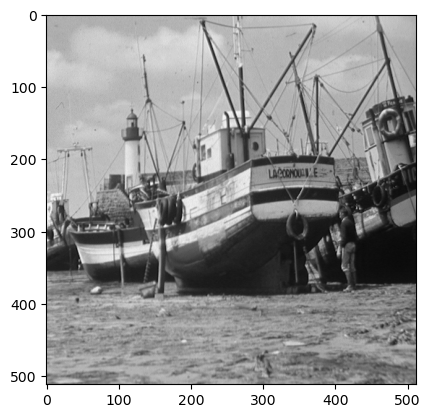

In [10]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

In [11]:
def grayscale_morph(img, strell):
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.erosion(img,strell),morpho.dilation(img,strell),
          morpho.opening(img,strell),morpho.closing(img,strell)]
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
  plt.show()

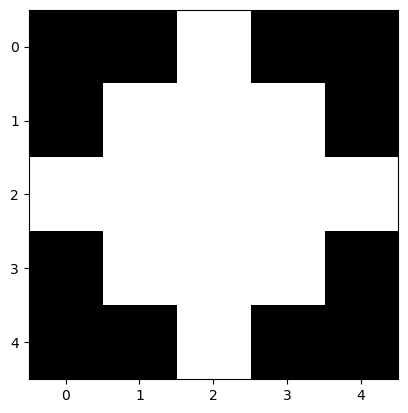

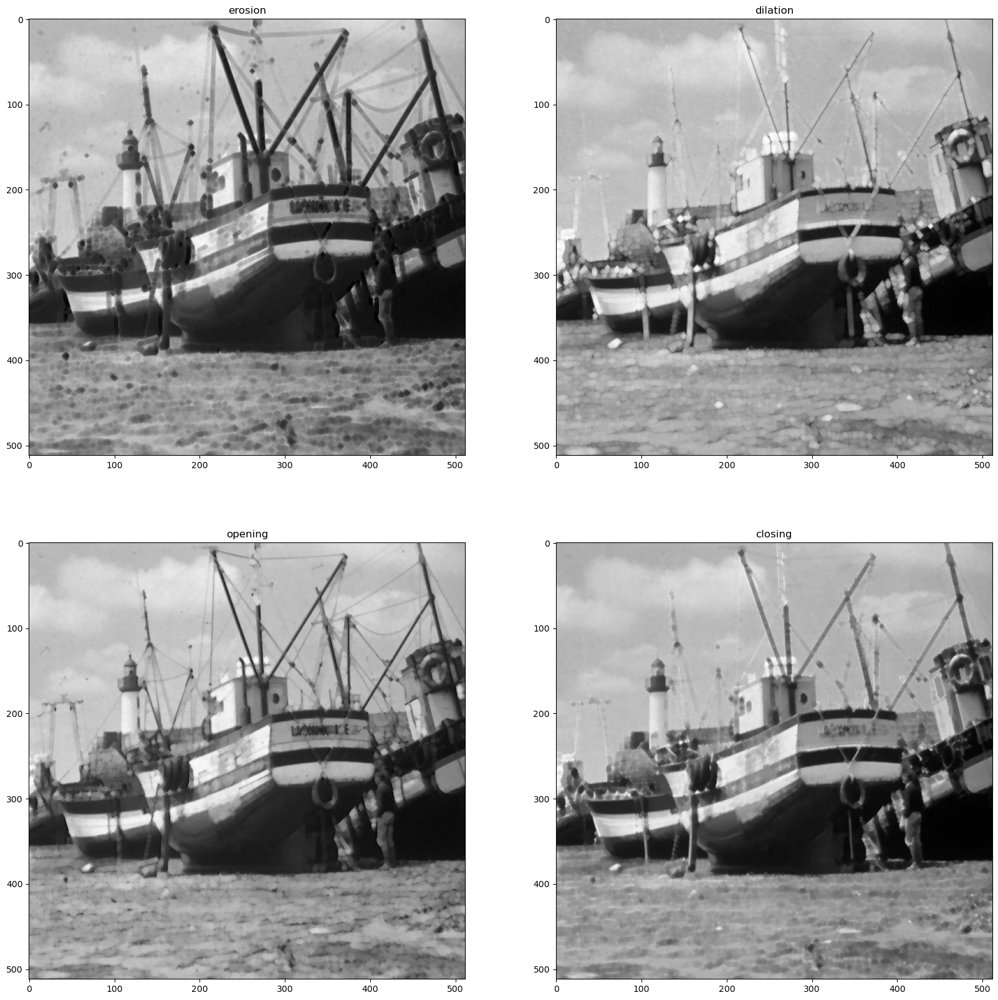

In [12]:
strell = morpho.disk(2)
plt.imshow(strell, cmap = plt.cm.gray)
grayscale_morph(img,strell)

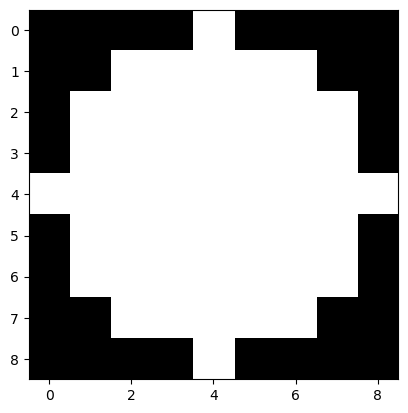

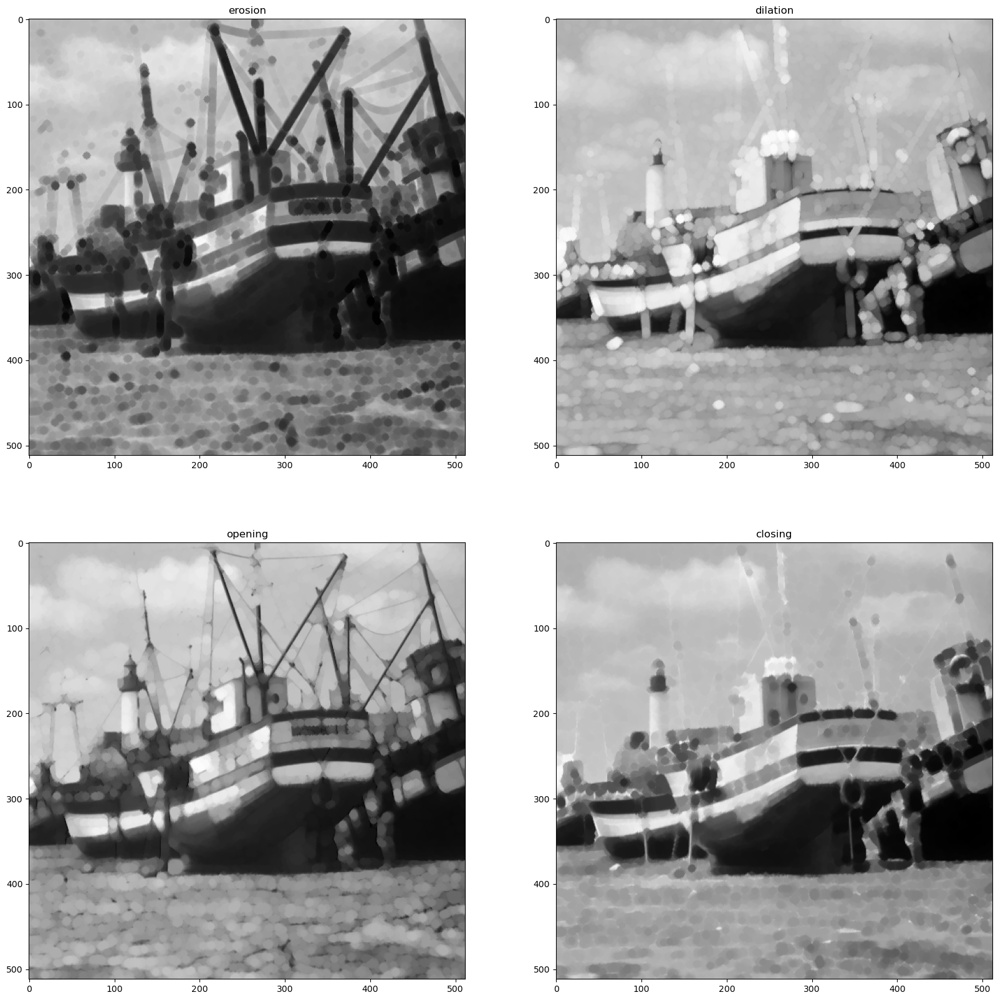

In [13]:
strell = morpho.disk(4)
plt.imshow(strell, cmap = plt.cm.gray)
grayscale_morph(img,strell)

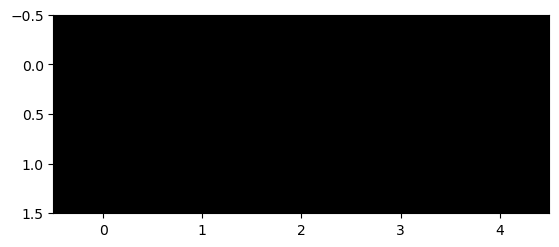

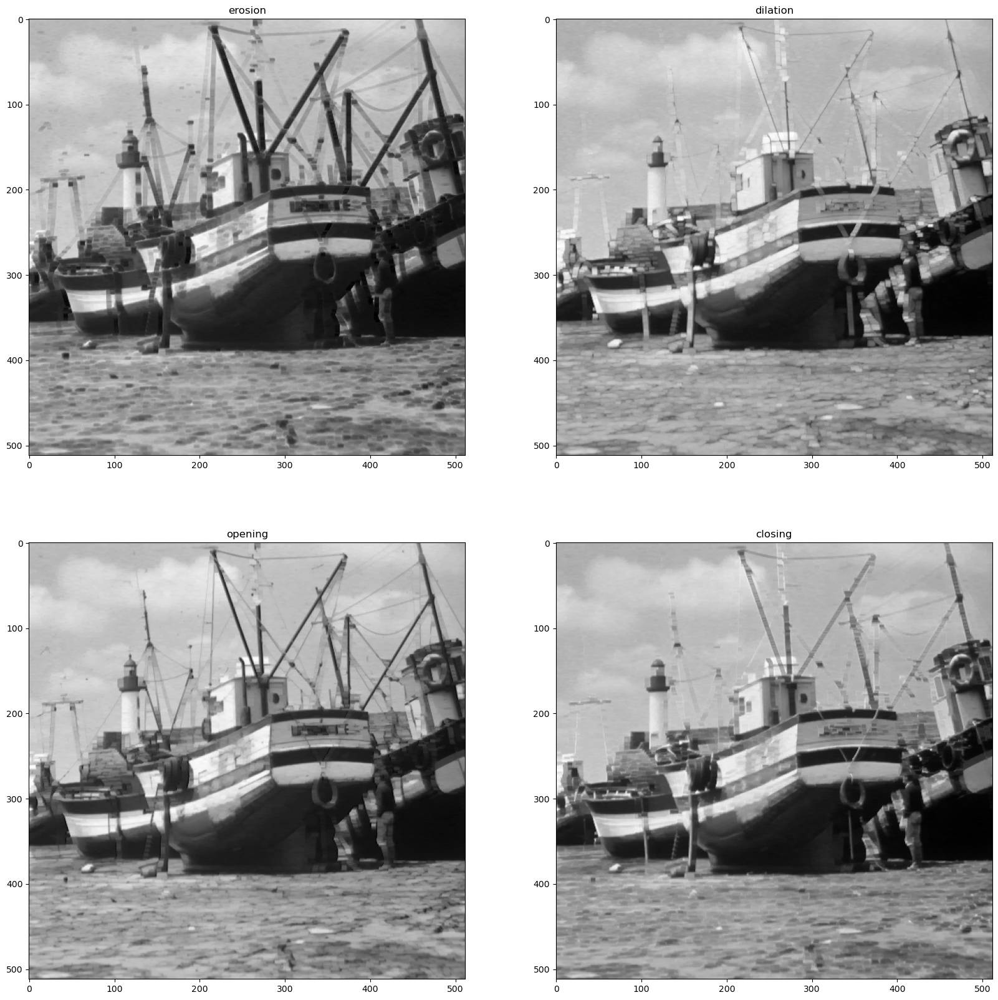

In [14]:
strell = line_strell(5,2)
plt.imshow(strell, cmap = plt.cm.gray)
grayscale_morph(img,strell)

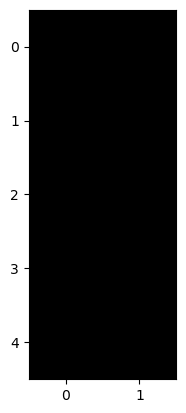

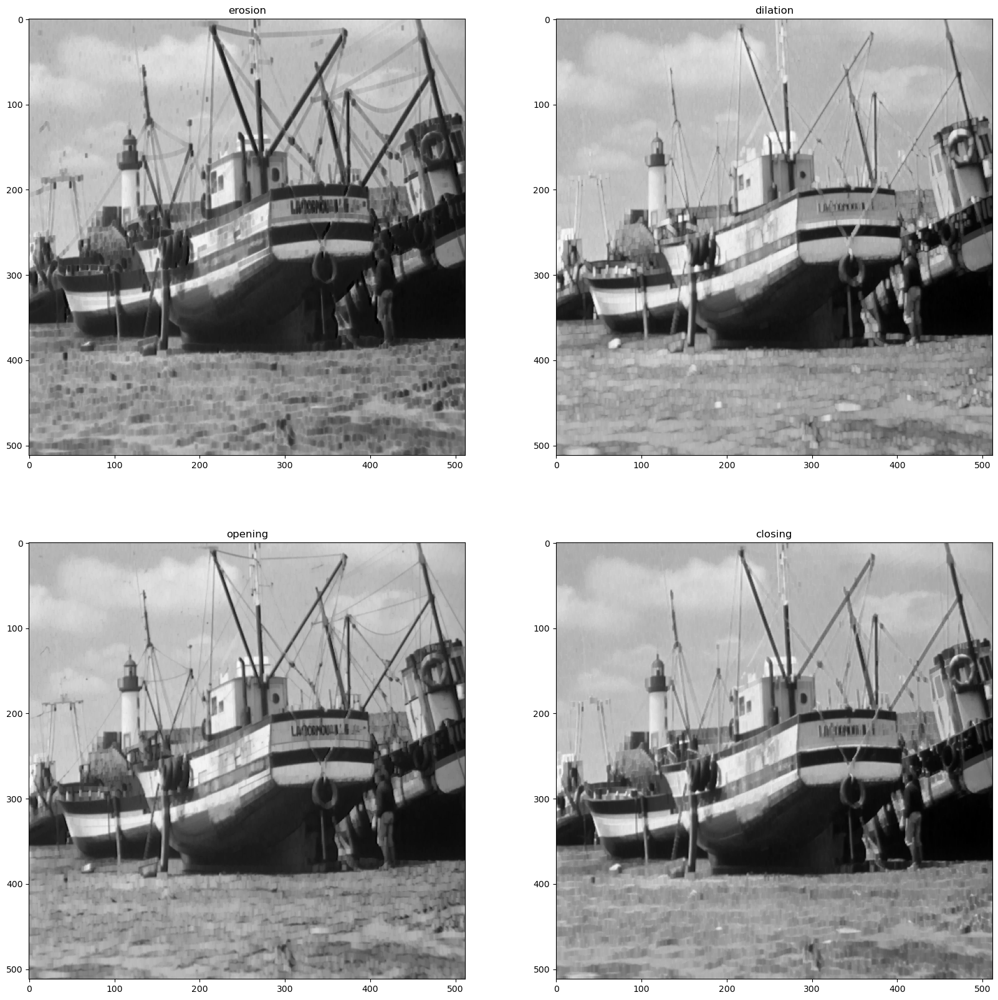

In [15]:
strell = line_strell(2,5)
plt.imshow(strell, cmap = plt.cm.gray)
grayscale_morph(img,strell)

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** :

**Shape of the Structuring Element:(view the sea in the image to better see the difference between shapes)**
* **Disk: Rounds the objects and the texture of the image while dilation or erosion.**
* **Vertical Line:  elongates features vertically in the image.**
* **Horizontal Line: elongates features horizontally in the image.**

**Size of the Structuring Element: Disk :**
* **Radius 2: enhance fine details and preserve small-scale features.**
* **Radius 4: broader impact, affecte larger structures.**

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : **The sequential dilation by a disk $D(r = 2)$ followed by a disk $D(r = 3)$  will result in a cumulative dilation of 2 + 3 = 5 units. However we will see some pixel-to-pixel differences between the image resulting from the sequential dilation and the image resulting from a single disk $D(r = 5)$ dilation because the value of pixels where calculated differently.**
$$ 
D(D(X,B_{D(r = 2)}),B_{D(r = 3)}) \neq D(X,B_{D(r = 5)})
$$

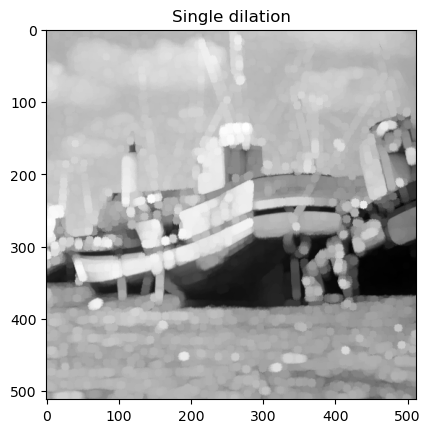

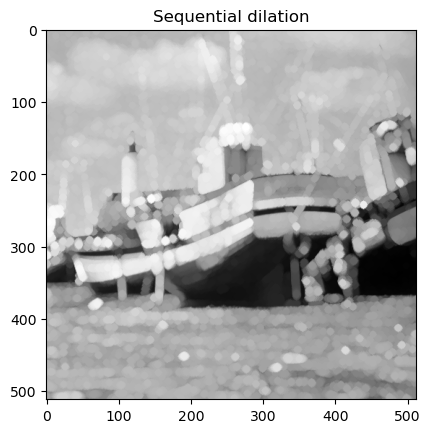

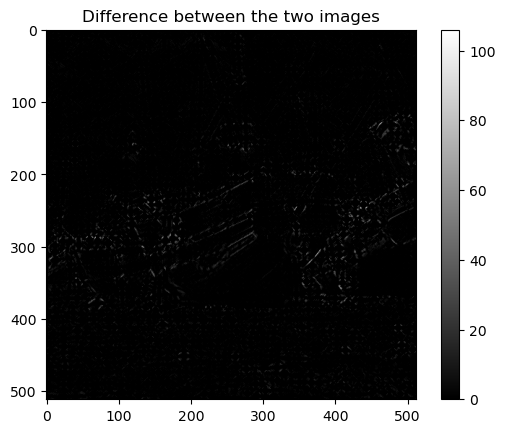

195761


In [16]:
if student:
  ### start code
  dilation = morpho.dilation(img, morpho.disk(5))
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()

  sequential_dilation =  morpho.dilation(morpho.dilation(img, morpho.disk(2)), morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()

  plt.imshow(np.abs(dilation-sequential_dilation),cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** Plot the result of an delation by a disk structuring element of size 2 followed by
a dilation by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** **the delation by a disk structuring element of size 2 followed by a dilation by a disk structuring element of size 3 with gives exactly the same result of a dilation of the image by (a disk of size 2 dilated by a disk of size 3).**
$$
D(D(X,B_{D(r = 2)}),B_{D(r = 3)}) = D(X,D(B_{D(r = 2)},B_{D(r = 3)}))
$$
**This is similar to the convolution property of linear filter**
$$
h_3 *(h_2 * X) = (h_3 * h_2) * X
$$
**D'ou **
$$
D(B_{D(r = 2)},B_{D(r = 3)}) \neq B_{D(r = 5)}
$$

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 1 1 1 1 1 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


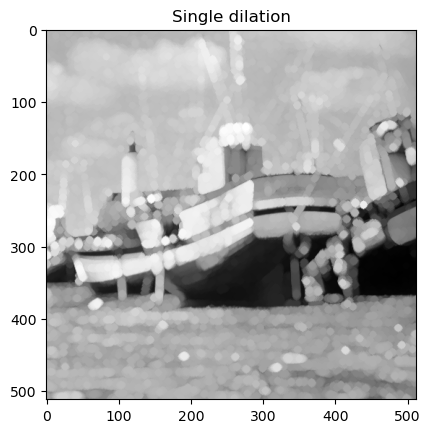

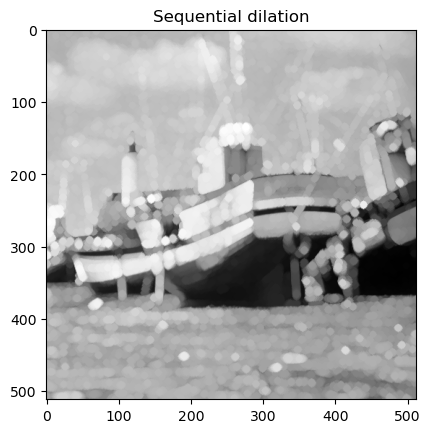

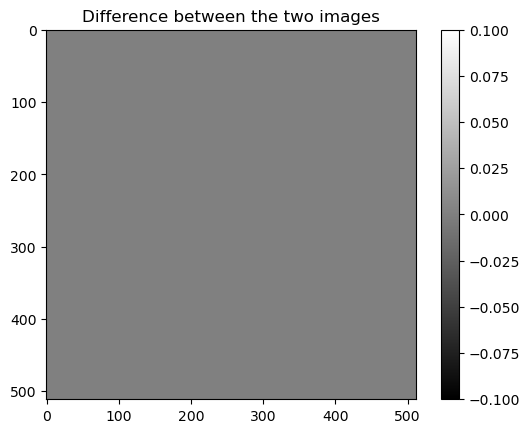

0


In [17]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3
  sqr_strell = morpho.disk(2)
  sqr_strell = np.pad(sqr_strell,((3,3),(3,3)),'constant',constant_values = 0)
  sqr_strell = morpho.dilation(sqr_strell,morpho.disk(3))
  print(sqr_strell)
  

  # Use it to perform the image dilation
  dilation = morpho.dilation(img, sqr_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.dilation(morpho.dilation(img,morpho.disk(2)),morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation")
  plt.show()
    
  plt.imshow(np.abs(dilation-sequential_dilation),cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

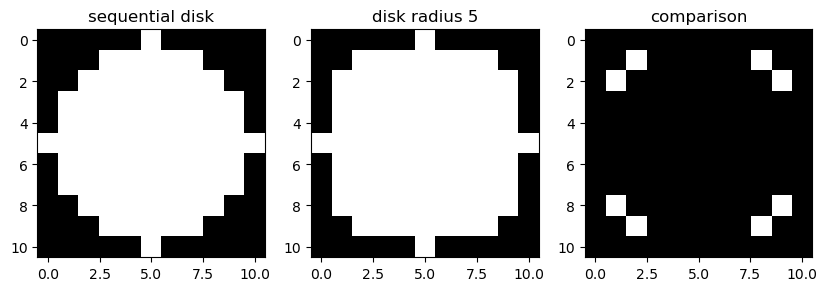

In [18]:
fig ,ax = plt.subplots(1,3, figsize = (10,10))
ax[0].imshow(sqr_strell,cmap = "gray")
ax[0].set_title("sequential disk")
ax[1].imshow(morpho.disk(5),cmap = "gray")
ax[1].set_title("disk radius 5")
ax[2].imshow(np.abs(morpho.disk(5) - sqr_strell),cmap = "gray")
ax[2].set_title("comparison")

plt.show()

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


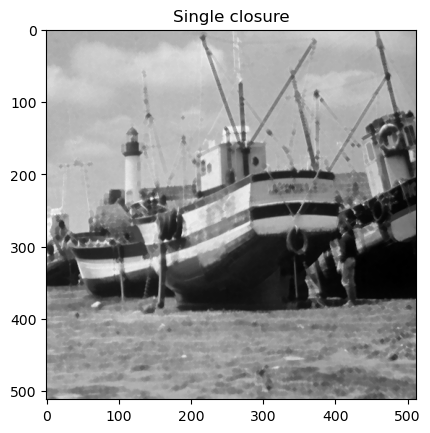

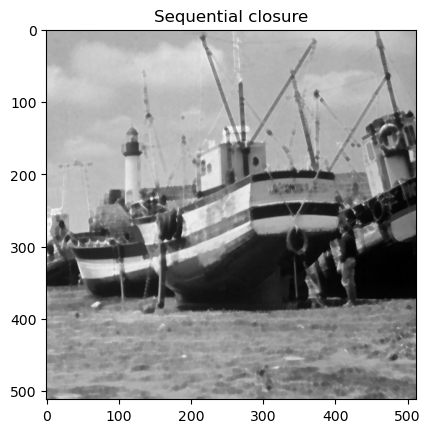

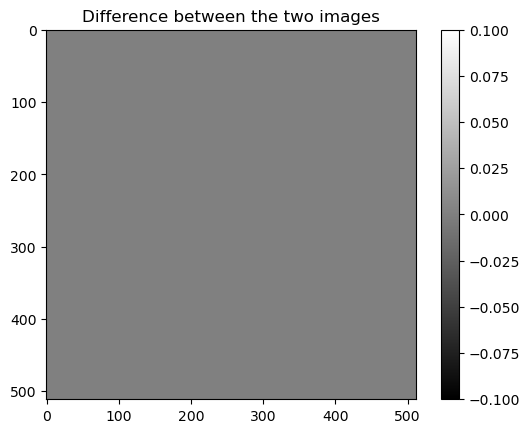

0


In [19]:
if student:
  ### start code
  closure = morpho.closing(img, morpho.disk(2))
  plt.imshow(closure,cmap = "gray")
  plt.title("Single closure")
  plt.show()

  sequential_closure =  morpho.closing(morpho.closing(img, morpho.disk(2)), morpho.disk(2))
  plt.imshow(sequential_closure,cmap = "gray")
  plt.title("Sequential closure")
  plt.show()

  plt.imshow(np.abs(closure-sequential_closure),cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(closure-sequential_closure)))

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : **The top-hat transform with a disk of radius 2 as a structuring element returns an image containing objects in the original image that are smaller than the radius of the structuring element and are <u>brighter</u> than their surroundings. in our case because the radius is small it will detect bright contours.**

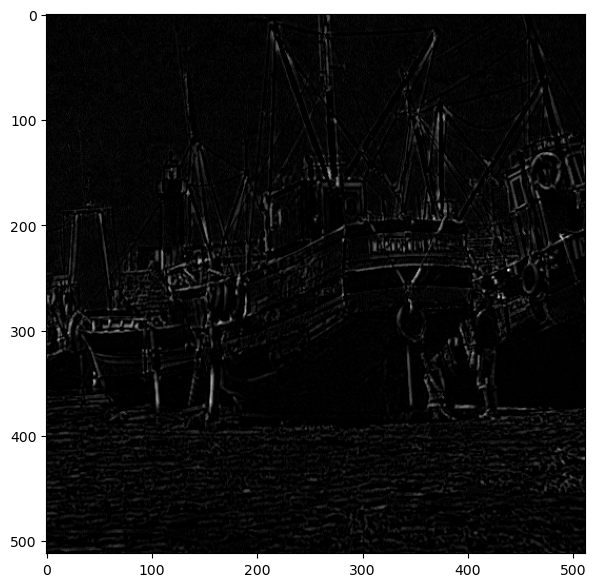

In [20]:
if student:
  ### start code
  strell = morpho.disk(2)
  top_hat = img - morpho.opening(img, strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : **The dual top-hat transform with a disk of radius 2 as a structuring element returns an image containing objects in the original image that are 'smaller' than the radius of the structuring element and are <u>darker</u> than their surroundings. in our case because the radius is small it will detect dark contours (exemple : strings of the ship)**

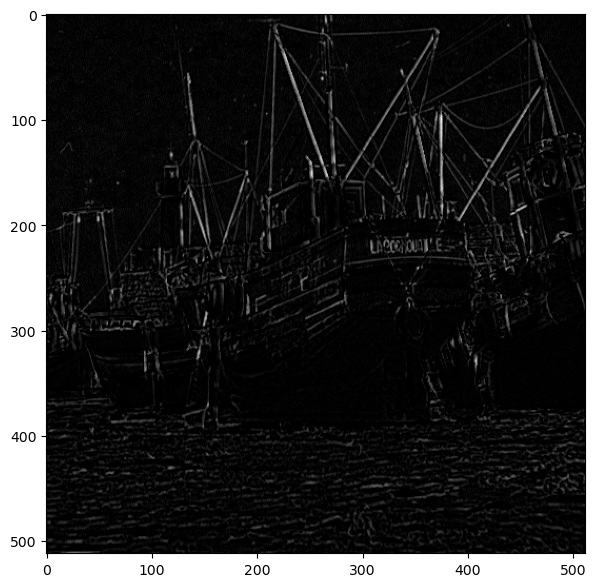

In [21]:
if student:
  ### start code
  strell = morpho.disk(2)
  dual_top_hat =  morpho.closing(img, strell)- img
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**:**The alternate sequential filter involves progressively increasing the size of a structuring element and applying sequential opening and closing operations. It's effective for reducing noise in images, especially when the nature of the noise (light or dark) is uncertain. As the structuring element enlarges, finer details fade, resulting in larger, more uniform regions. This method preserves sharp image edges while potentially sacrificing nearby details, which can be useful for highlighting and segmenting larger objects of interest.**

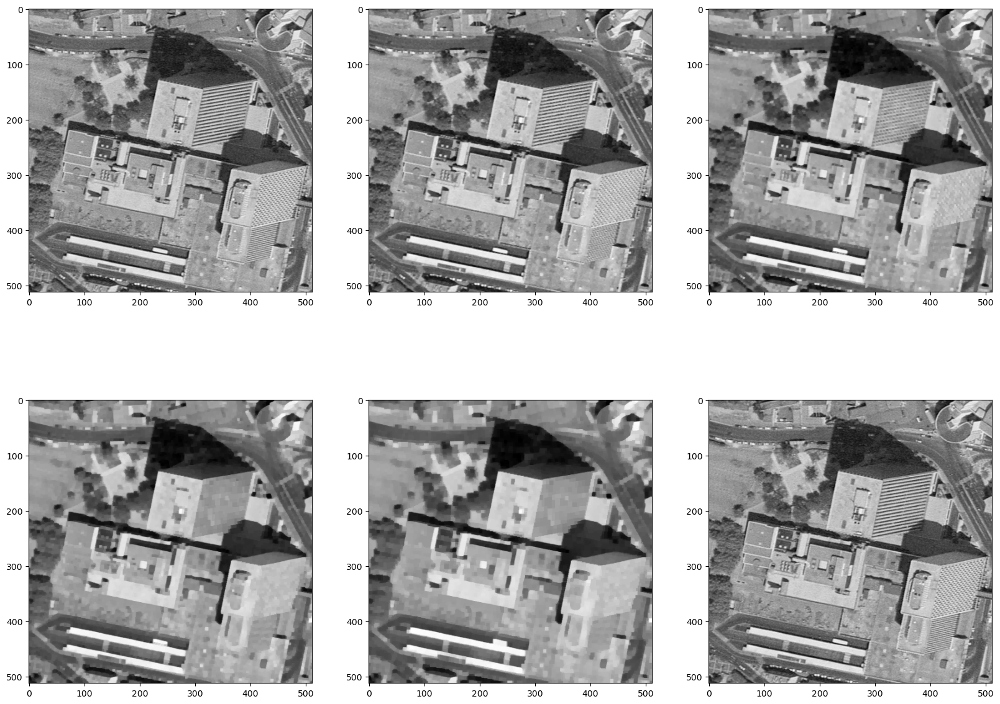

In [22]:
# Example
img = skio.imread("images/montreuil.tif")

# Structuring elements
se1 = morpho.square(1)
se2 = morpho.square(2)
se3 = morpho.square(3)
se4 = morpho.square(4)
se5 = morpho.square(5)

# Images
fas1 = morpho.closing(morpho.opening(img,se1),se1) 
fas2 = morpho.closing(morpho.opening(fas1,se2),se2)  
fas3 = morpho.closing(morpho.opening(fas2,se3),se3)
fas4 = morpho.closing(morpho.opening(fas3,se4),se4)
fas5 = morpho.closing(morpho.opening(fas4,se5),se5)

fig,ax = plt.subplots(2,3,figsize = (20,15))
ax[0,0].imshow(fas1,cmap = "gray")
ax[0,1].imshow(fas2,cmap = "gray")
ax[0,2].imshow(fas3,cmap = "gray")
ax[1,0].imshow(fas4,cmap = "gray")
ax[1,1].imshow(fas5,cmap = "gray")
ax[1,2].imshow(img,cmap = "gray")
plt.show()

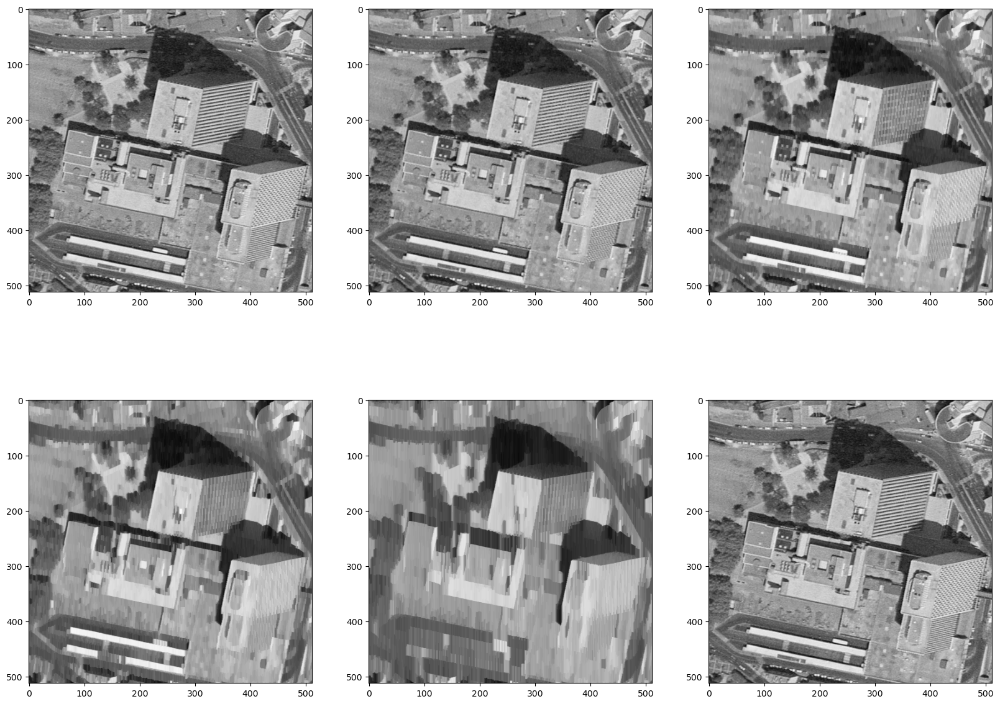

In [23]:
#Try you own
if student :
  # Structuring elements
  se1 = line_strell(1,1)
  se2 = line_strell(1,2)
  se3 = line_strell(1,4)
  se4 = line_strell(1,8)
  se5 = line_strell(1,16)

  # Images
  fas1 = morpho.closing(morpho.opening(img,se1),se1) 
  fas2 = morpho.closing(morpho.opening(fas1,se2),se2)  
  fas3 = morpho.closing(morpho.opening(fas2,se3),se3)
  fas4 = morpho.closing(morpho.opening(fas3,se4),se4)
  fas5 = morpho.closing(morpho.opening(fas4,se5),se5)

  fig,ax = plt.subplots(2,3,figsize = (20,15))
  ax[0,0].imshow(fas1,cmap = "gray")
  ax[0,1].imshow(fas2,cmap = "gray")
  ax[0,2].imshow(fas3,cmap = "gray")
  ax[1,0].imshow(fas4,cmap = "gray")
  ax[1,1].imshow(fas5,cmap = "gray")
  ax[1,2].imshow(img,cmap = "gray")
  plt.show()
   

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: **When we apply a morphological gradient to the image 'cell.tif' with a structuring element of radius 1, we can observe the cell boundaries with varying intensity.In fact, Dilation tends to expand brighter regions, reduce darker ones, and may eliminate small dark details. Conversely, erosion enlarges darker areas, reduces brighter ones, and can remove small white features. Combining these two operations emphasizes the contrast between the expansion of bright regions in one and the contraction of dark regions in the other, effectively revealing the image's contours.**

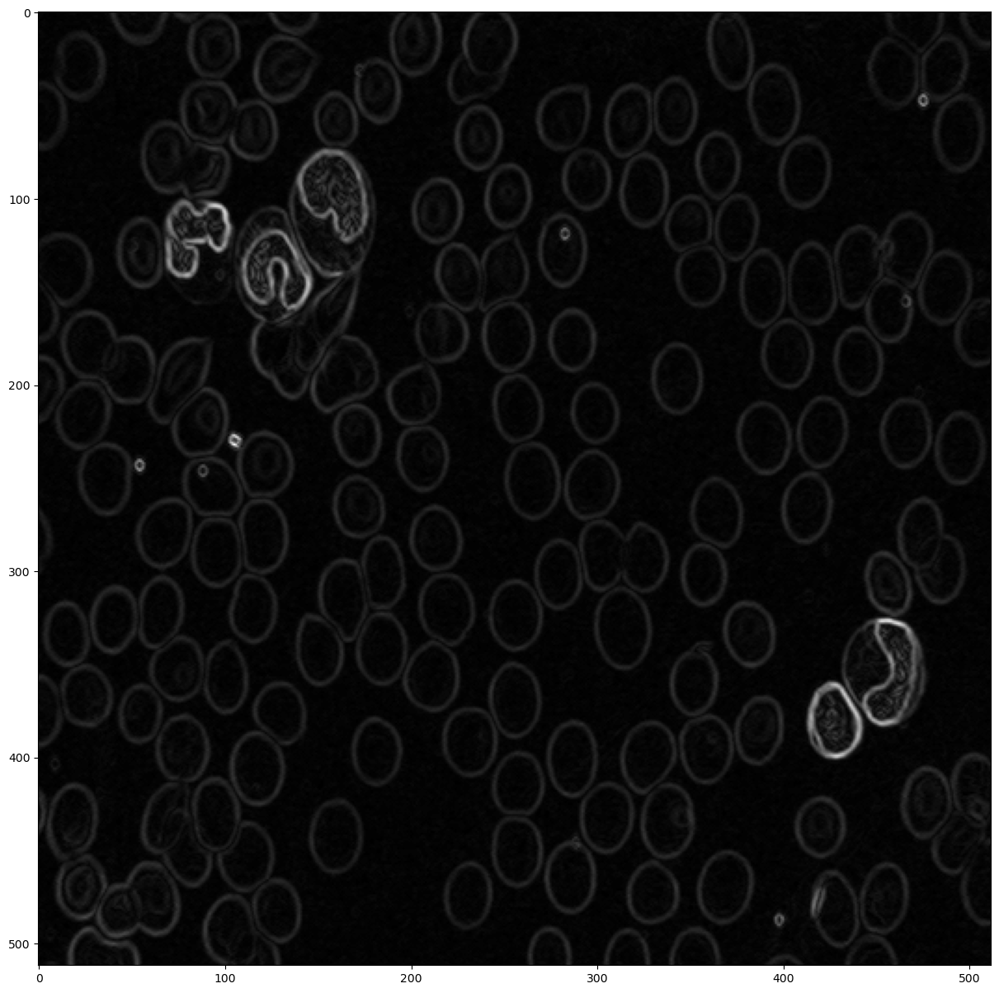

In [24]:
if student : 
  img = skio.imread("images/cell.tif")
  morpho_grad = morpho.dilation(img) - morpho.erosion(img)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()


- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : **It is difficult to find an appropriate value because this method is sensitive to image intensity variations. Therefore, when we choose a threshold, we might elliminate not only unwanted elements (like noise) but also erasing contours between regions with closely matched grayscale levels.**

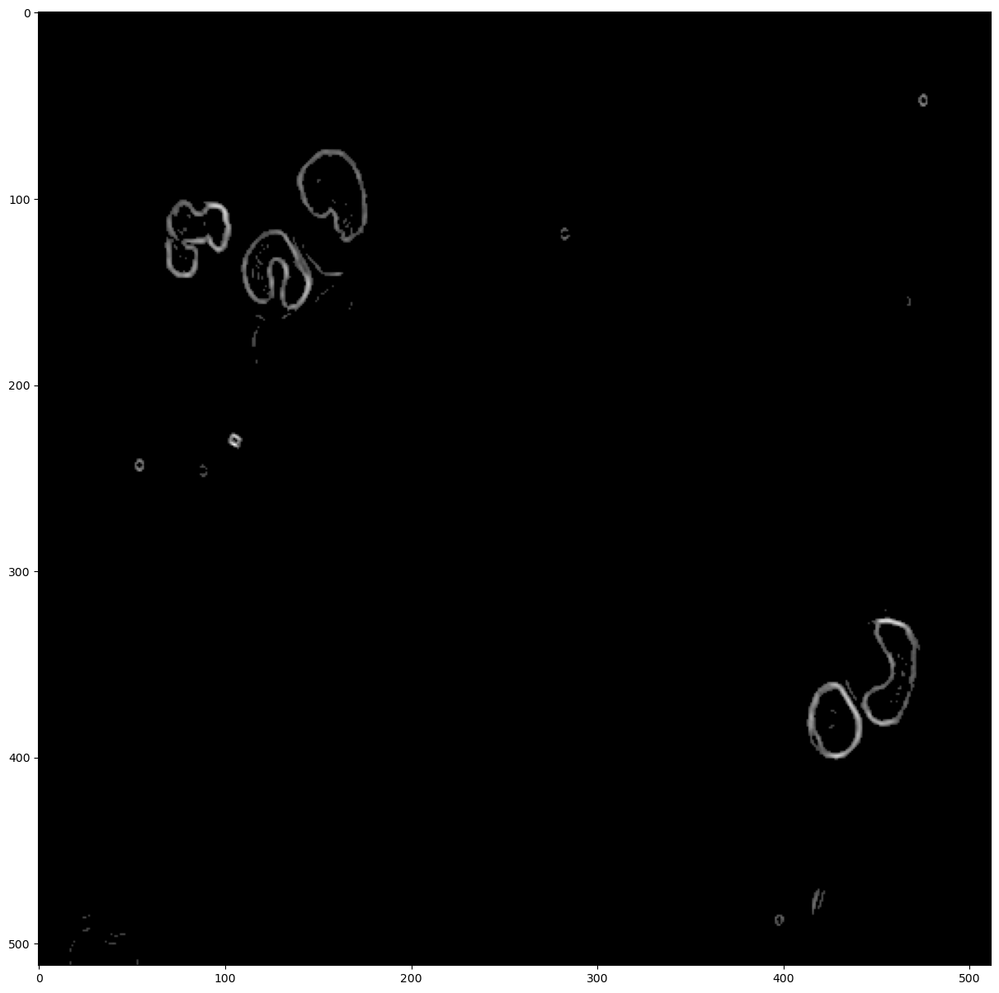

In [25]:
if student :
  thresh_grad = (morpho_grad > 25) * morpho_grad
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using segmentation.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** :(code in the next cell)  **We observe that the gradient image is segmented into different regions. In fact, "The watershed transformation treats the image it operates upon like a topographic map, with the brightness of each point representing its height, and finds the lines that run along the tops of ridges." (en.wikipedia.org).**

- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** :(code in the next cell) **The number and size of these regions vary depending on the interger "k" in the function "segmentation.watershed(morpho_grad,k)". the higher the value of "k" the more segmented the image (wich leads to over-segmentation if "k" is high enough). In fact, "k" is the number of markers (local minima of the gradient), used to make the marker image. This image used by watershed algorithm to segment the gradient image.**

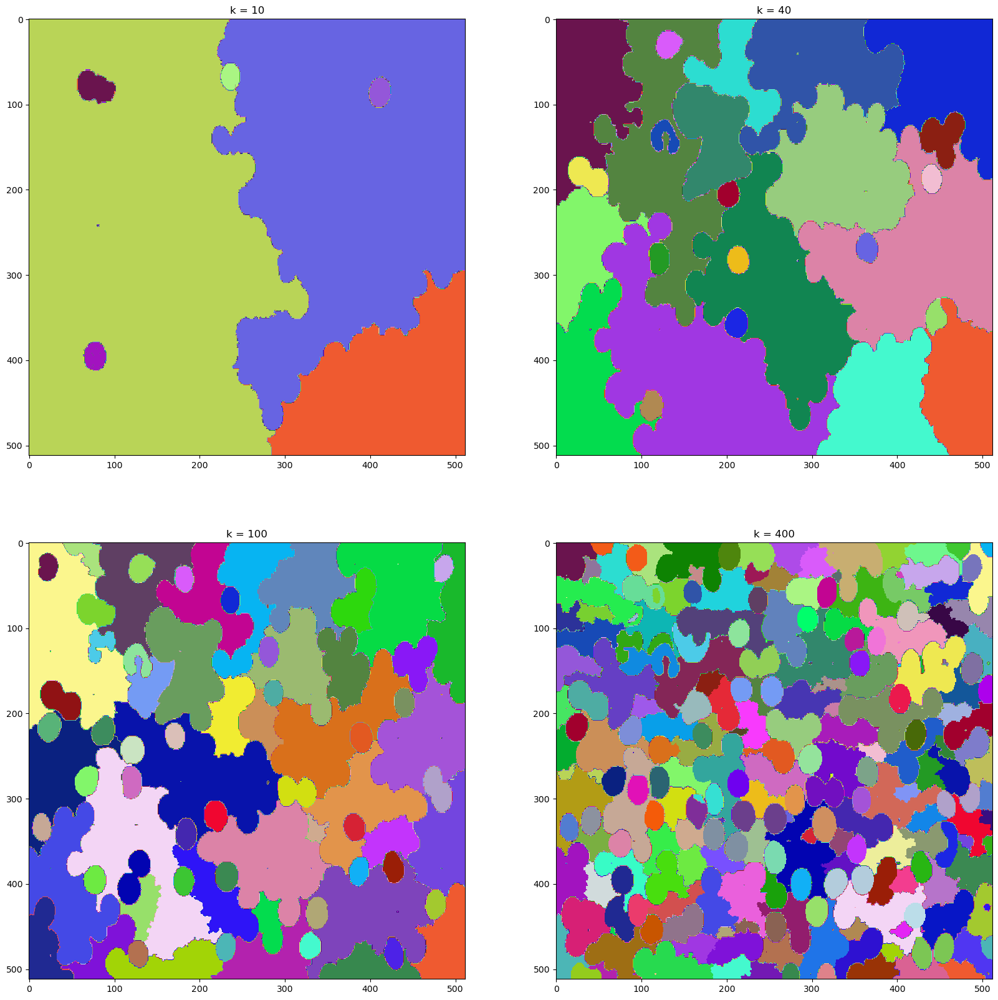

In [26]:
from skimage.segmentation import watershed
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
K = [10, 40, 100, 400]
if student :
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  wats = [ watershed(morpho_grad, K[i]) for i in range(4)]
  names = ["k = "+str(K[i]) for i in range(4)]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(wats[i],cmap = cmaprand)
  plt.show()
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : (code in the next cell) **If the value of 'k' is not specified, all the local minima are used as markers in the watershed algorithm, which can lead to over-segmentation. Applying a closing operation to the gradient image smoothes the gradient and connects nearby contours, resulting in a reduction of local minima. This reduction significantly reduces over-segmentation while preserving the shapes of the objects up to a certain point.**

- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : (code in the next cell) **Applying an opening with the same structuring element on the gradient image also reduces over-segmentation, but it does not preserve the shapes of the objects. It's as if it reduces the over-segmentation in the background.**

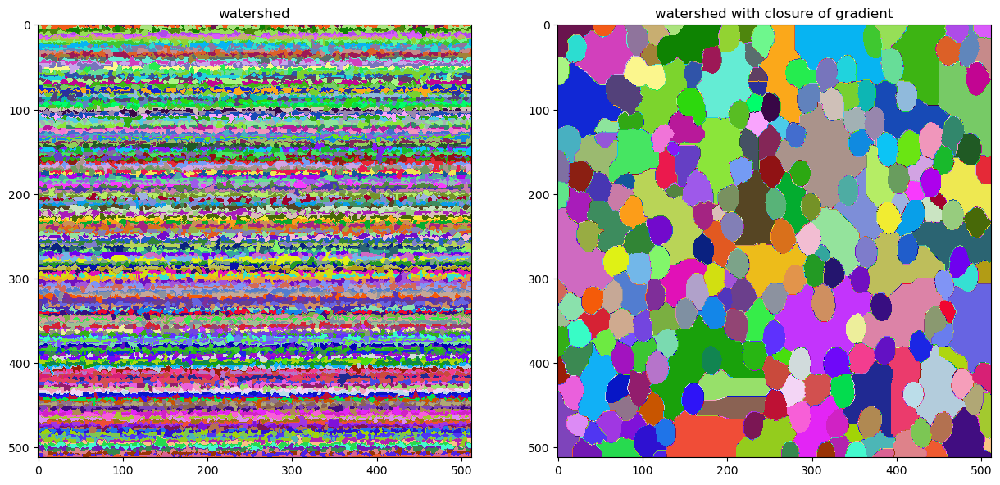

In [27]:
if student :
  wat = watershed(morpho_grad)
  wat_closing = watershed(morpho.closing(morpho_grad,morpho.disk(6)))
fig, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(wat,cmap =cmaprand)
ax[0].set_title("watershed")
ax[1].imshow(wat_closing,cmap =cmaprand)
ax[1].set_title("watershed with closure of gradient")
plt.show()

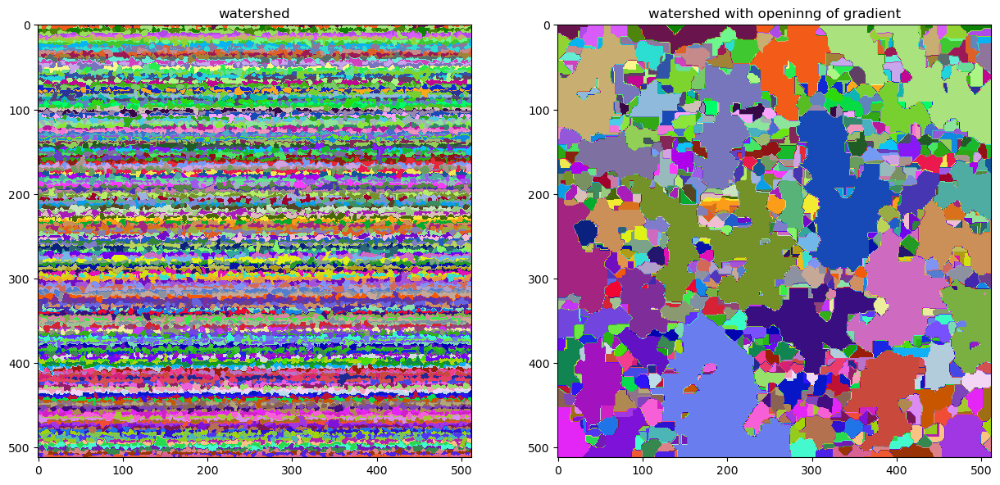

In [28]:
if student :
  wat = watershed(morpho_grad)
  wat_opening = watershed(morpho.opening(morpho_grad,morpho.disk(6)))
fig, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(wat,cmap =cmaprand)
ax[0].set_title("watershed")
ax[1].imshow(wat_opening,cmap =cmaprand)
ax[1].set_title("watershed with openinng of gradient")
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : **We observe a significant amount of noise in the image, which would not help us to efficiently segment the cells.**

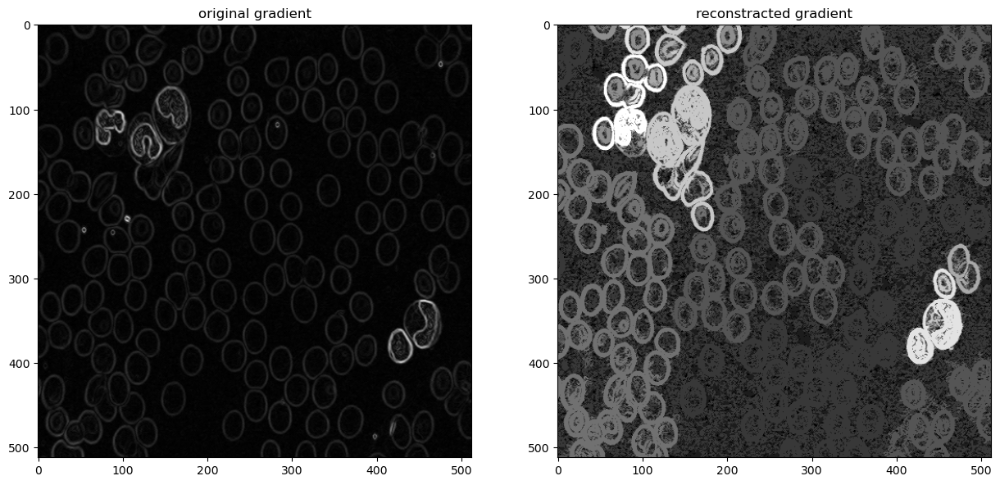

In [74]:
imOpen = morpho.opening(morpho_grad,morpho.disk(5))
reco1 =  morpho.reconstruction(imOpen,morpho_grad,method='dilation')
fig, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(morpho_grad,cmap = "gray")
ax[0].set_title("original gradient")
ax[1].imshow(reco1,cmap ="gray")
ax[1].set_title("reconstracted gradient")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : **We observe a reduction in the amount of noise and minor details in the image, which would help us to efficiently segment the cells.**

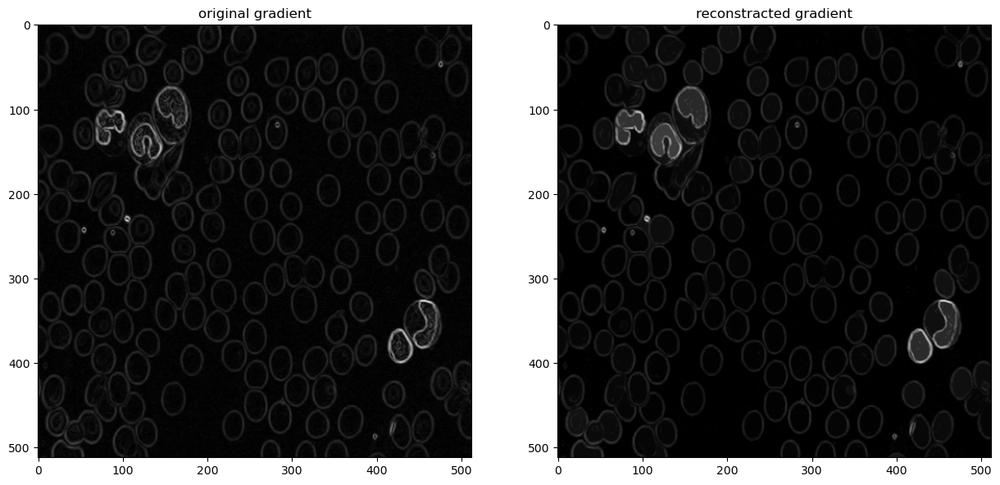

In [75]:
imClos = morpho.closing(morpho_grad,morpho.disk(5))
reco2 = morpho.reconstruction(imClos,morpho_grad,method='erosion')
fig, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(morpho_grad,cmap = "gray")
ax[0].set_title("original gradient")
ax[1].imshow(reco2,cmap ="gray")
ax[1].set_title("reconstracted gradient")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

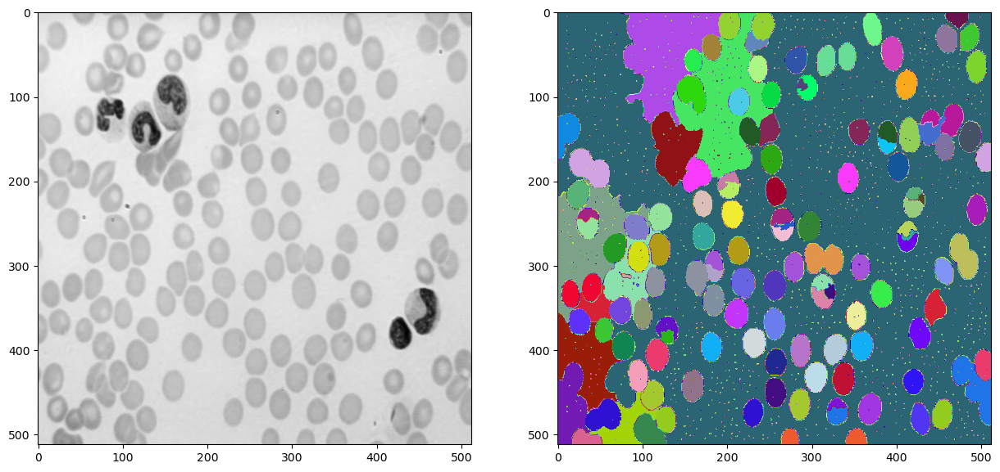

In [78]:
from skimage.feature import peak_local_max
from scipy import ndimage as ndi

coords = peak_local_max(reco2,min_distance = 5)
mask = np.zeros(reco2.shape, dtype=bool)
mask[tuple(coords.T)] = True
markers, _ = ndi.label(mask)
wat = watershed(morpho_grad,markers)

fig, ax = plt.subplots(1, 2, figsize=(15,15))
ax[0].imshow(img,cmap = "gray")
ax[0].set_title("")
ax[1].imshow(wat,cmap =cmaprand)
ax[1].set_title("")
plt.show()